In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_A1-2.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 24192 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 1026 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

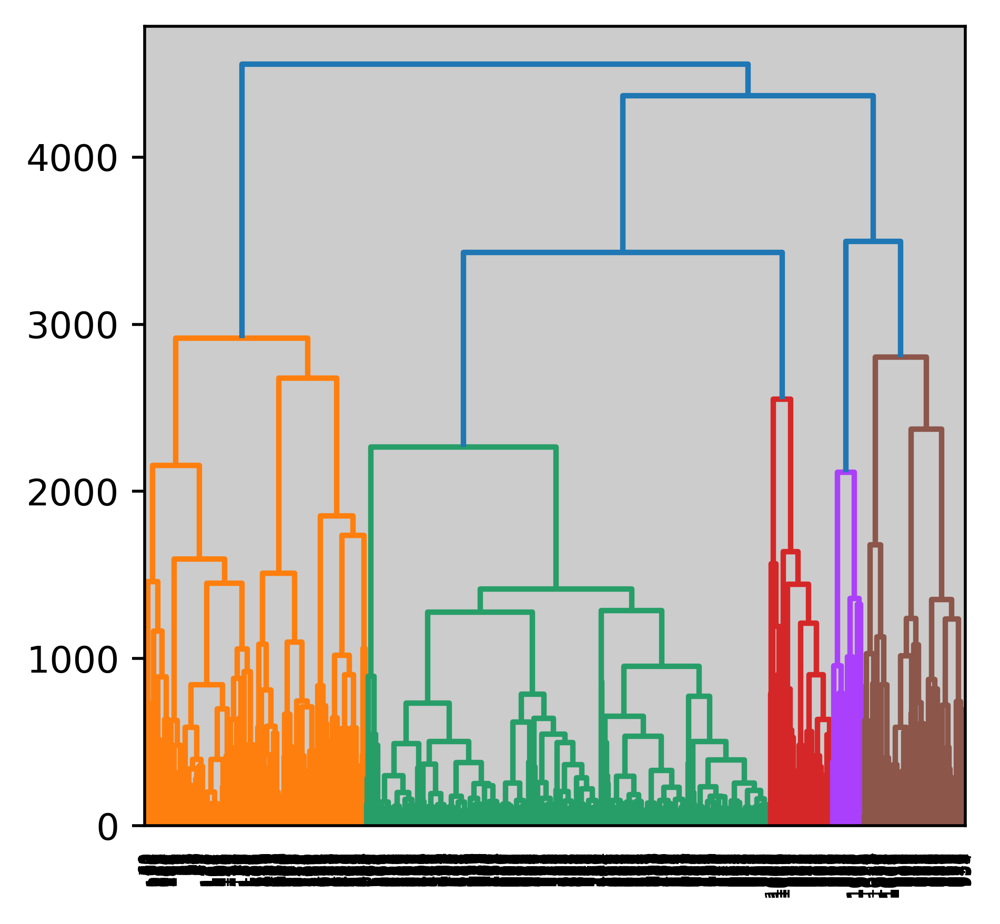

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 1026 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=500, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[303 351 387 ...  24  26  36]


/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7737892.pbs/ipykernel_3514594/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

44     434
3       10
2        9
57       9
0        7
      ... 
189      1
188      1
187      1
186      1
499      1
Name: SMC_clusters, Length: 500, dtype: int64

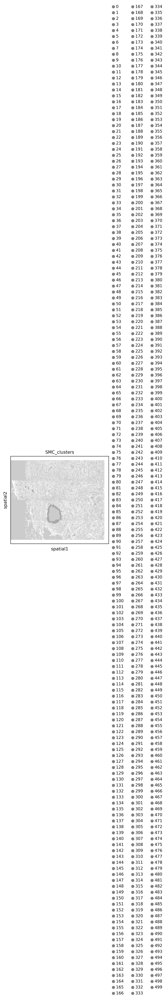

In [17]:
sc.pl.spatial(adata_aec, color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

In [18]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[44, 3, 2, 57, 0, 22]

In [19]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [20]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [21]:
adata_aec_subset

AnnData object with n_obs × n_vars = 475 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [22]:
del adata_aec_subset.uns['SMC_clusters_colors']

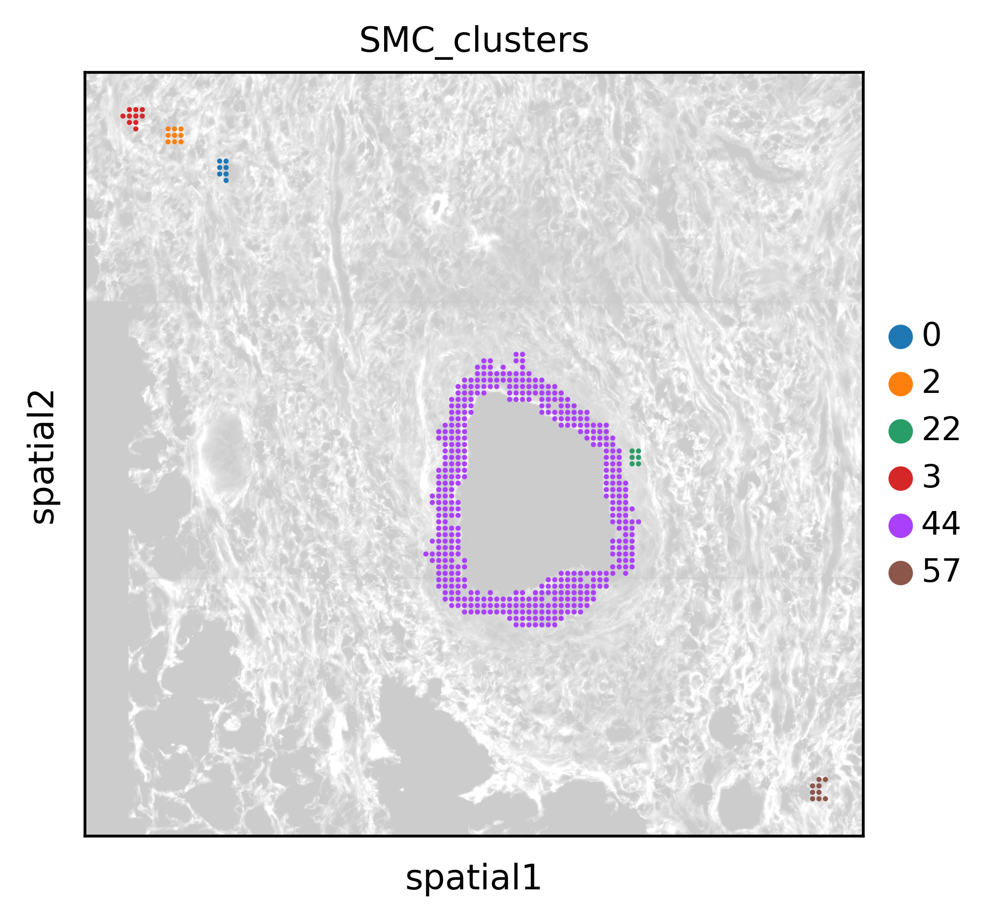

In [23]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

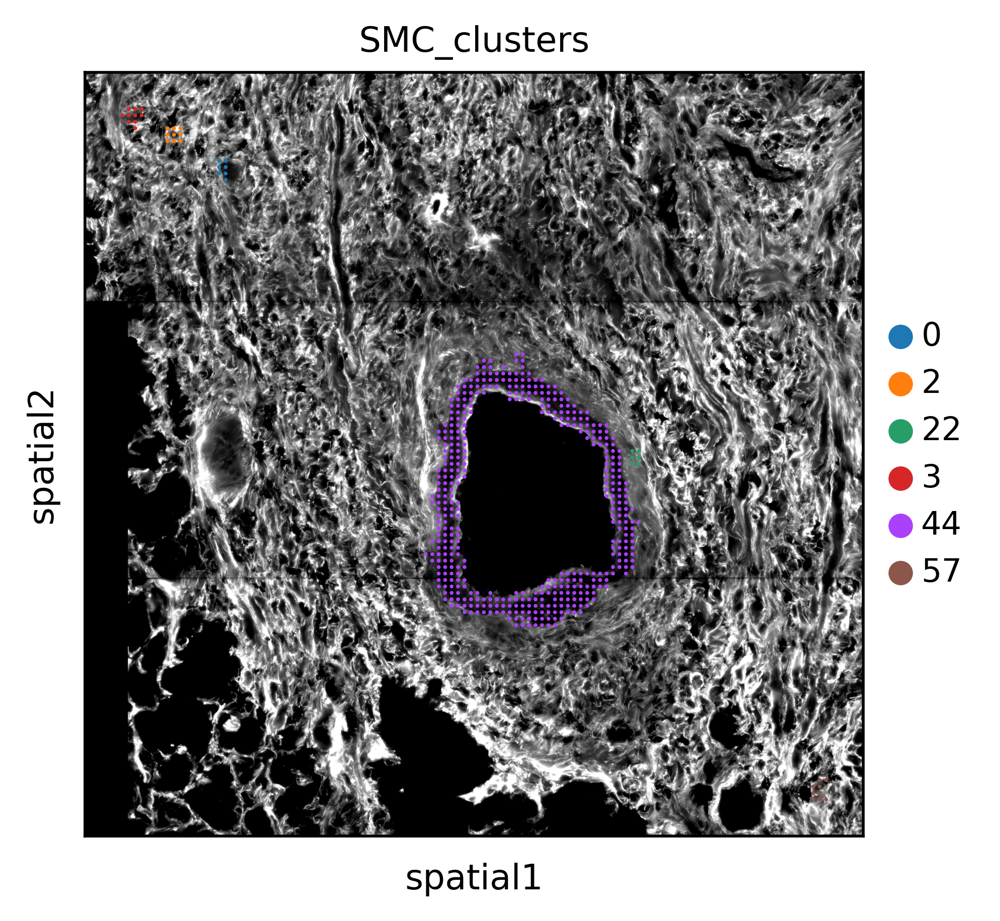

In [24]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

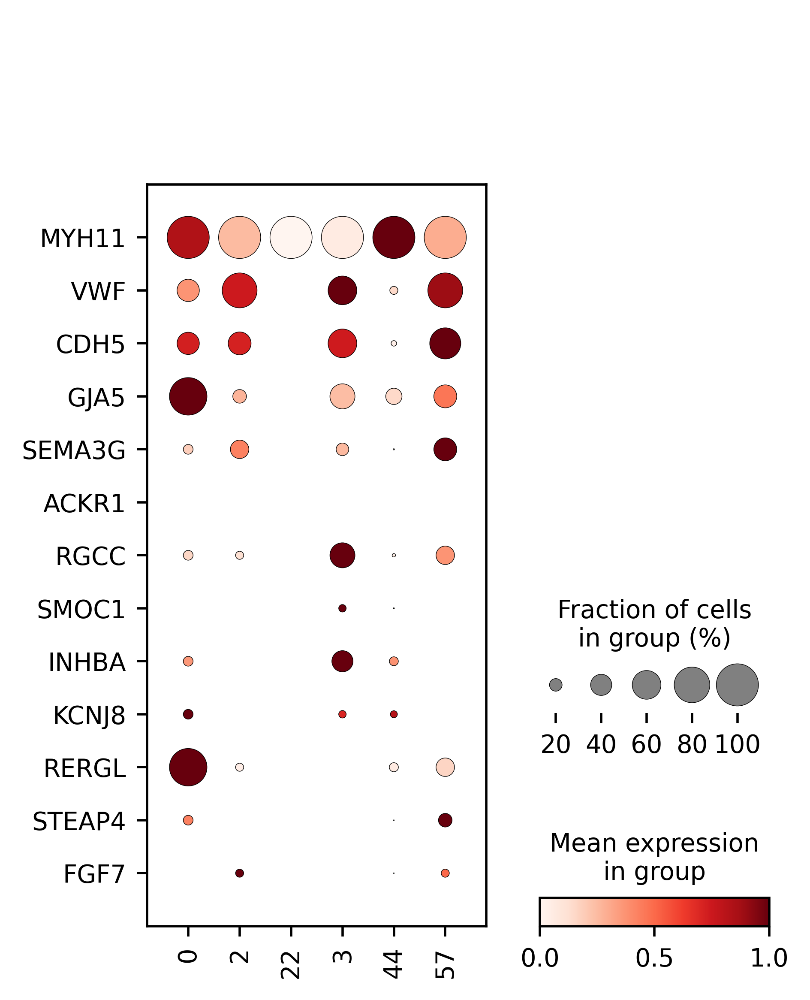

In [25]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [26]:
# add gene percentage expressed to dataframe

In [27]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [28]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [29]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [30]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [31]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [32]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [33]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [34]:
adata_aec_subset

AnnData object with n_obs × n_vars = 475 × 98
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [35]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [36]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0
2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0
22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0
44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0
57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0


In [37]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [38]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [39]:
matrix2 = matrix.replace(0, np.NaN)

In [40]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [41]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
0,3.166667,1.0,NaN,4.714286,1.000,1.00,NaN,1.0,NaN
2,1.000000,NaN,2.0,1.000000,NaN,1.00,NaN,1.0,NaN
22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,1.800000,1.000,1.00,NaN,1.8,1.000000
44,1.339286,1.0,1.0,3.157233,1.275,1.00,NaN,1.2,1.666667
57,1.333333,1.5,1.0,1.600000,NaN,1.75,NaN,1.0,NaN


### add expression values to dataframe

In [42]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [43]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0,3.166667,1.0,NaN,4.714286,1.000,1.00,NaN,1.0,NaN
2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0,1.000000,NaN,2.0,1.000000,NaN,1.00,NaN,1.0,NaN
22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0,NaN,NaN,NaN,1.800000,1.000,1.00,NaN,1.8,1.000000
44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0,1.339286,1.0,1.0,3.157233,1.275,1.00,NaN,1.2,1.666667
57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0,1.333333,1.5,1.0,1.600000,NaN,1.75,NaN,1.0,NaN


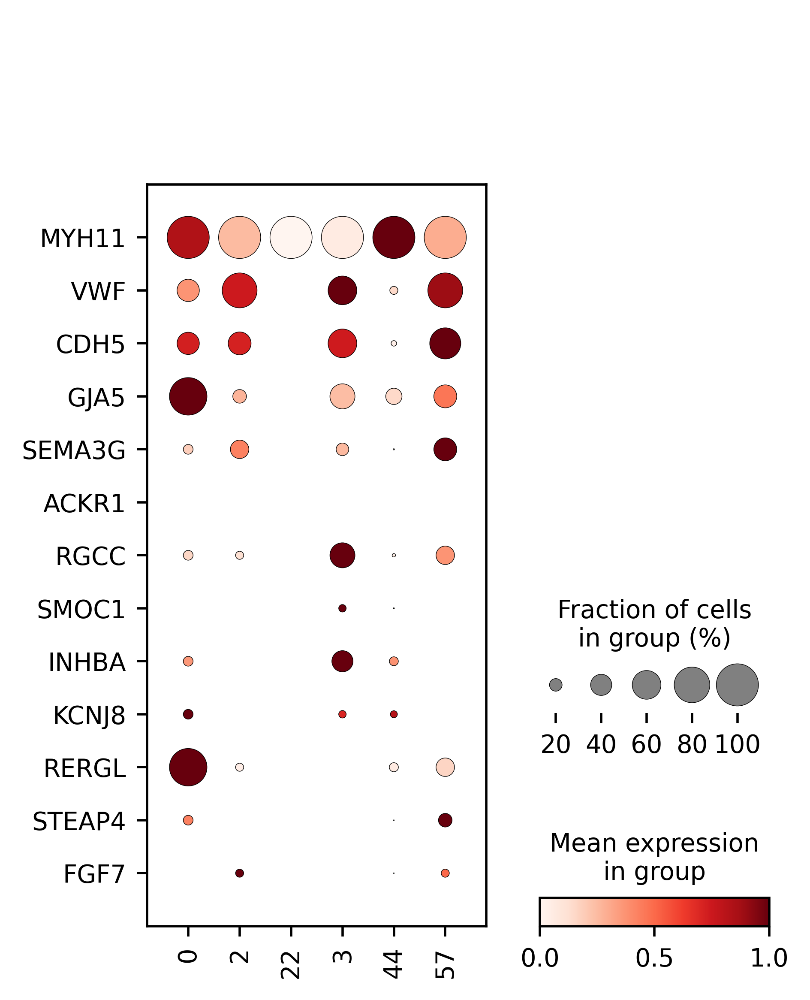

In [44]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [45]:
#add vessel type annotation column

In [46]:
test["Vessel"] = ['Artery','Artery','Unclear','Unclear','Unclear','Artery']

In [47]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0,3.166667,1.0,NaN,4.714286,1.000,1.00,NaN,1.0,NaN,Artery
2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0,1.000000,NaN,2.0,1.000000,NaN,1.00,NaN,1.0,NaN,Artery
22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear
3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0,NaN,NaN,NaN,1.800000,1.000,1.00,NaN,1.8,1.000000,Unclear
44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0,1.339286,1.0,1.0,3.157233,1.275,1.00,NaN,1.2,1.666667,Unclear
57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0,1.333333,1.5,1.0,1.600000,NaN,1.75,NaN,1.0,NaN,Artery


### add vessel size numbers

In [48]:
adata_aec_subset.obs.SMC_clusters.value_counts()

44    434
3      10
2       9
57      9
0       7
22      6
Name: SMC_clusters, dtype: int64

In [49]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [52]:
test2.columns = list(test2.columns[0:17]) + ['size']

In [53]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0,3.166667,1.0,NaN,4.714286,1.000,1.00,NaN,1.0,NaN,Artery,7
2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0,1.000000,NaN,2.0,1.000000,NaN,1.00,NaN,1.0,NaN,Artery,9
22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,6
3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0,NaN,NaN,NaN,1.800000,1.000,1.00,NaN,1.8,1.000000,Unclear,10
44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0,1.339286,1.0,1.0,3.157233,1.275,1.00,NaN,1.2,1.666667,Unclear,434
57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0,1.333333,1.5,1.0,1.600000,NaN,1.75,NaN,1.0,NaN,Artery,9


In [54]:
group=pd.Series("Large", index=test2.index)

In [55]:
group[test2["size"] <= 30] = "Small"

In [56]:
group

SMC_clusters
0     Small
2     Small
22    Small
3     Small
44    Large
57    Small
dtype: object

In [57]:
test2["group"] = group

In [58]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0,3.166667,1.0,NaN,4.714286,1.000,1.00,NaN,1.0,NaN,Artery,7,Small
2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0,1.000000,NaN,2.0,1.000000,NaN,1.00,NaN,1.0,NaN,Artery,9,Small
22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small
3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0,NaN,NaN,NaN,1.800000,1.000,1.00,NaN,1.8,1.000000,Unclear,10,Small
44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0,1.339286,1.0,1.0,3.157233,1.275,1.00,NaN,1.2,1.666667,Unclear,434,Large
57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0,1.333333,1.5,1.0,1.600000,NaN,1.75,NaN,1.0,NaN,Artery,9,Small


In [59]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [60]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0,3.166667,1.0,NaN,4.714286,1.000,1.00,NaN,1.0,NaN,Artery,7,Small,Artery_Small
2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0,1.000000,NaN,2.0,1.000000,NaN,1.00,NaN,1.0,NaN,Artery,9,Small,Artery_Small
22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small,Unclear_Small
3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0,NaN,NaN,NaN,1.800000,1.000,1.00,NaN,1.8,1.000000,Unclear,10,Small,Unclear_Small
44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0,1.339286,1.0,1.0,3.157233,1.275,1.00,NaN,1.2,1.666667,Unclear,434,Large,Unclear_Large
57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0,1.333333,1.5,1.0,1.600000,NaN,1.75,NaN,1.0,NaN,Artery,9,Small,Artery_Small


### add ROI numbers

In [61]:
test2.index = ['ROI_A1-2_' + str(i) for i in test2.index.tolist()]

In [62]:
test2["ROI"] = "A1-2"

In [63]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,...,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_A1-2_0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0,3.166667,1.0,NaN,...,1.000,1.00,NaN,1.0,NaN,Artery,7,Small,Artery_Small,A1-2
ROI_A1-2_2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0,1.000000,NaN,2.0,...,NaN,1.00,NaN,1.0,NaN,Artery,9,Small,Artery_Small,A1-2
ROI_A1-2_22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small,Unclear_Small,A1-2
ROI_A1-2_3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0,NaN,NaN,NaN,...,1.000,1.00,NaN,1.8,1.000000,Unclear,10,Small,Unclear_Small,A1-2
ROI_A1-2_44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0,1.339286,1.0,1.0,...,1.275,1.00,NaN,1.2,1.666667,Unclear,434,Large,Unclear_Large,A1-2
ROI_A1-2_57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0,1.333333,1.5,1.0,...,NaN,1.75,NaN,1.0,NaN,Artery,9,Small,Artery_Small,A1-2


[Text(0.5, 1.0, 'RERGL percentage expression')]

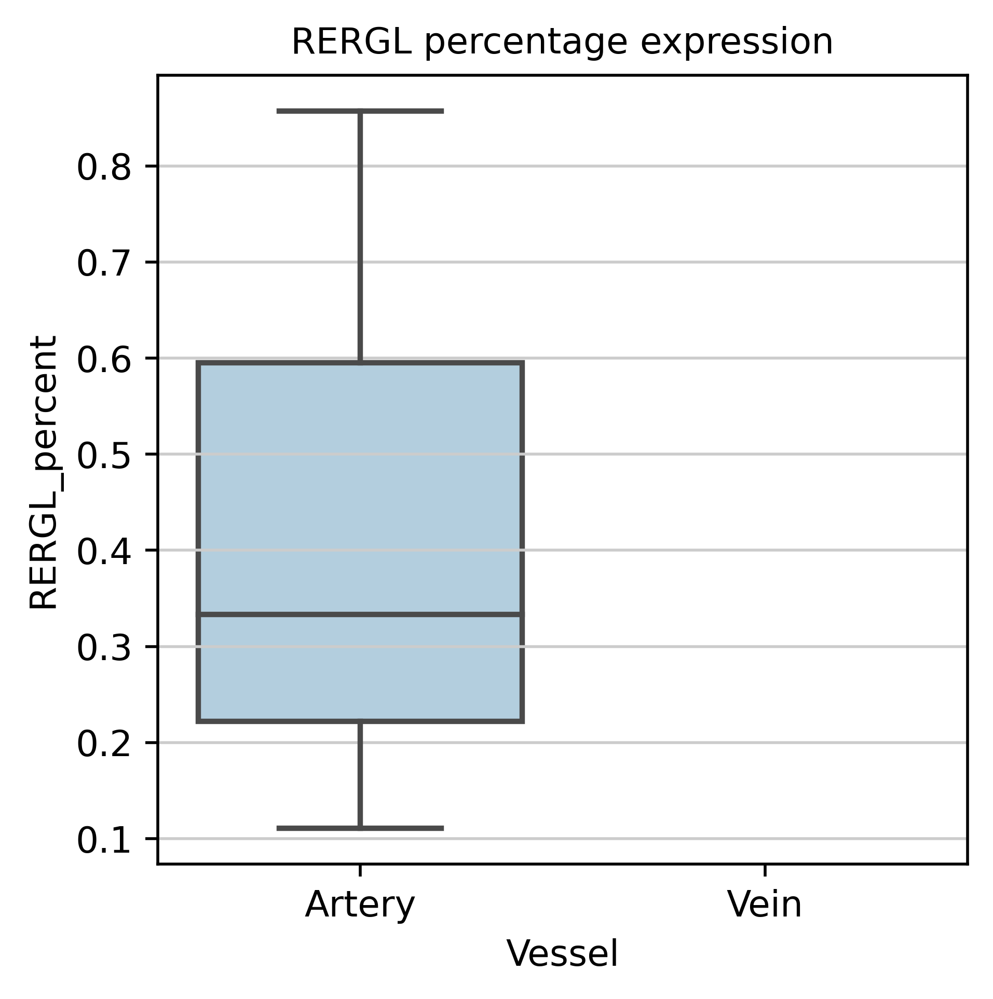

In [51]:
sns.boxplot(data = test2, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

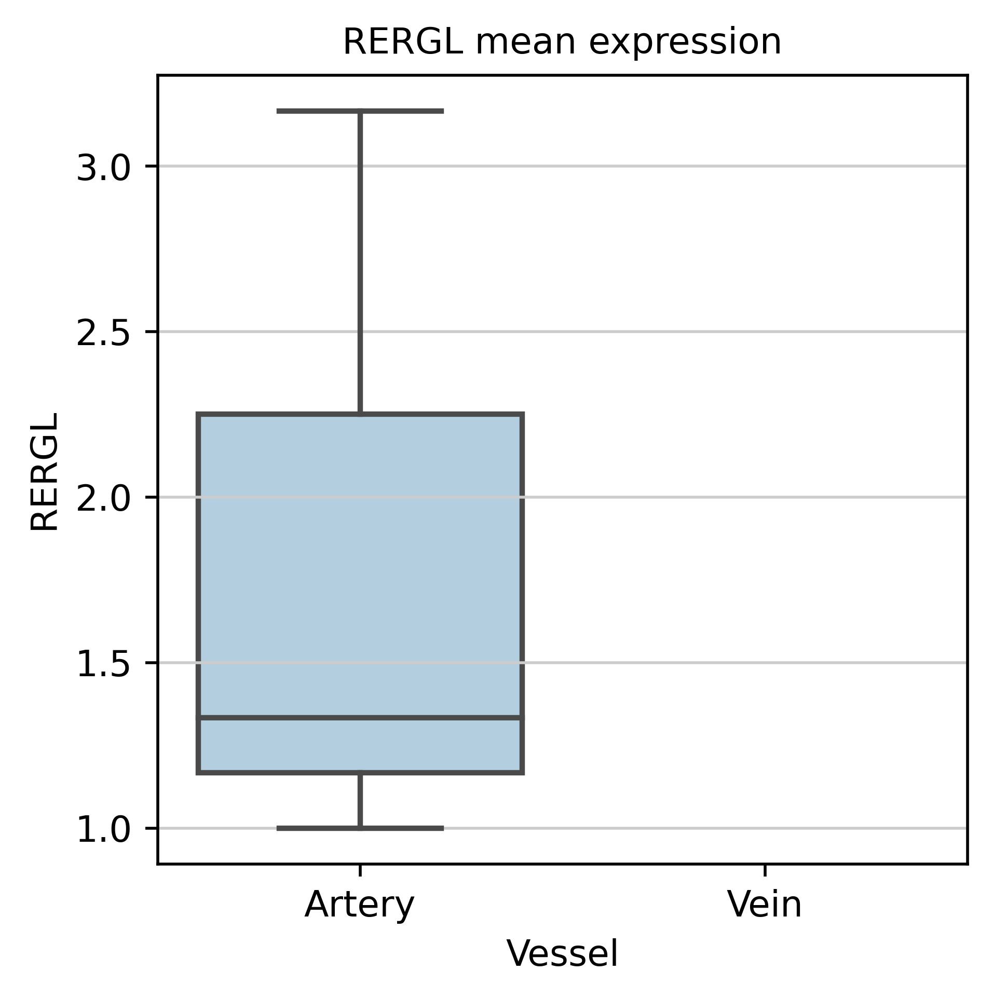

In [52]:
sns.boxplot(data = test2, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

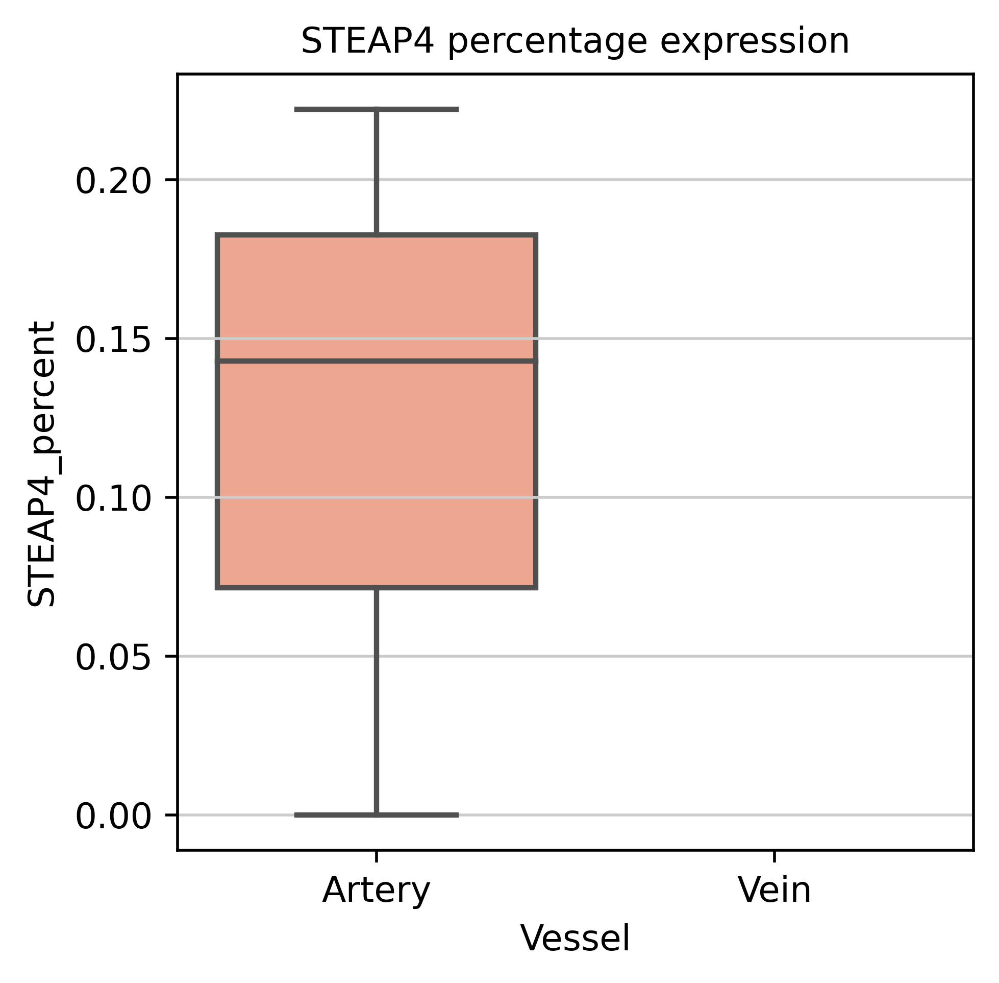

In [53]:
sns.boxplot(data = test2, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

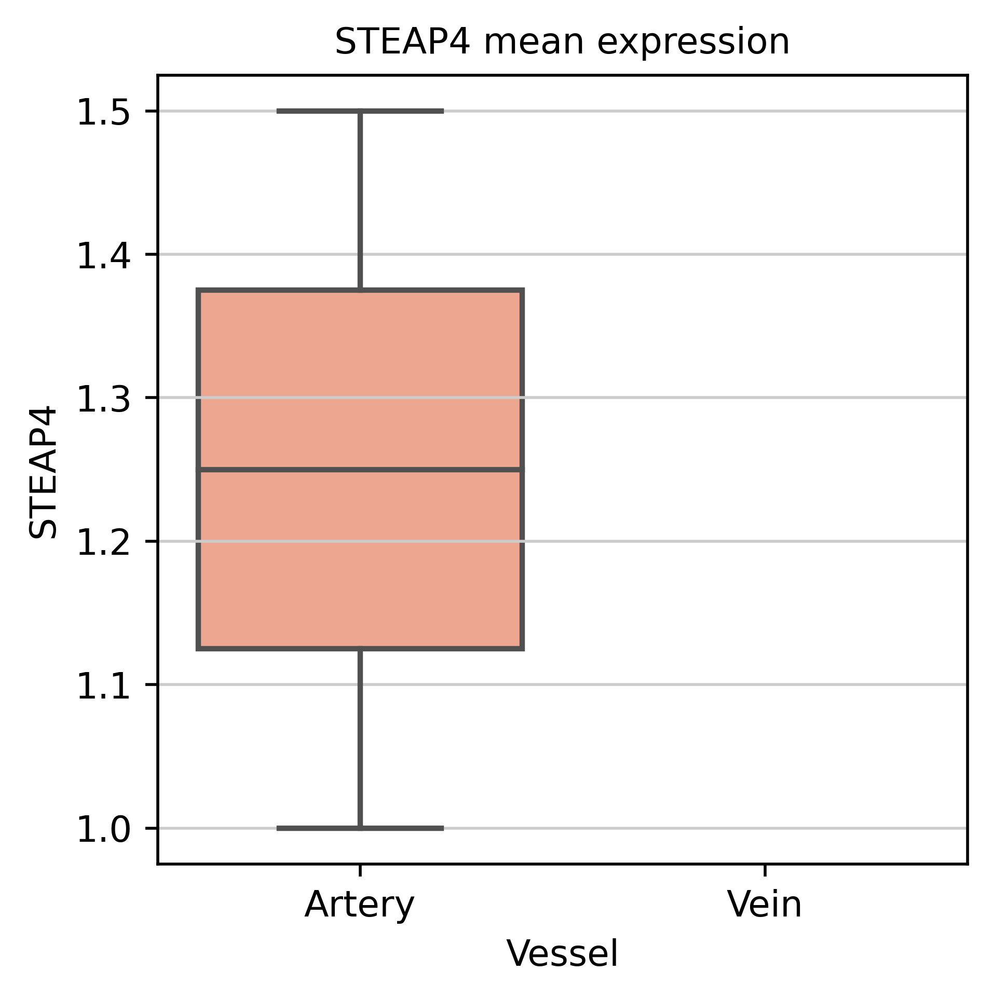

In [54]:
sns.boxplot(data = test2, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

In [55]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,ROI
ROI_A1-2_0,0.857143,0.142857,0.000000,0.142857,1.000000,0.0,0.0,3.166667,1.0,NaN,4.714286,1.000,1.00,NaN,1.0,NaN,Artery,A1-2
ROI_A1-2_2,0.111111,0.000000,0.111111,0.000000,0.444444,0.0,0.0,1.000000,NaN,2.0,1.000000,NaN,1.00,NaN,1.0,NaN,Artery,A1-2
ROI_A1-2_22,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,A1-2
ROI_A1-2_3,0.000000,0.000000,0.000000,0.100000,0.500000,0.0,0.0,NaN,NaN,NaN,1.800000,1.000,1.00,NaN,1.8,1.000000,Unclear,A1-2
ROI_A1-2_44,0.129032,0.004608,0.004608,0.092166,0.366359,0.0,0.0,1.339286,1.0,1.0,3.157233,1.275,1.00,NaN,1.2,1.666667,Unclear,A1-2
ROI_A1-2_57,0.333333,0.222222,0.111111,0.000000,0.555556,0.0,0.0,1.333333,1.5,1.0,1.600000,NaN,1.75,NaN,1.0,NaN,Artery,A1-2
